Course name: Research Skills: Image Analysis <br>
Course code: 880877-M-3 <br>
Take-home Assignment <br>
Academic Year: 2021-2022, Blok 3. <br>
Sharon Ong <br>
Department of Cognitive Science and Artificial Intelligence <br>
Tilburg University <br>

Submitted by: Tobias Fechner <br>
Student number: 2111832 <br>
Administration number (ANR): 754336

In [1]:
# install libraries
# !pip install --user imageio
# !pip install --user scikit-image
# !pip install opencv-python
# !pip install plotly
# !pip install scikit-learn
# !pip install pandas
# !pip install sknw

In [2]:
import os
import numpy as np## 1.1 Loading an image 
import pandas as pd
import math
import time
from copy import deepcopy
from timeit import default_timer as timer

# import cv2 #TODO

import matplotlib.pyplot as plt
%matplotlib inline   
import plotly.express as px
from PIL import Image

import imageio
from skimage import io, color, data, img_as_float, filters, morphology, exposure, util
from skimage.color import label2rgb
from skimage.exposure import histogram 
from skimage.filters import try_all_threshold, threshold_otsu, prewitt_v, prewitt_h, prewitt, median, sato, frangi, meijering, hessian, rank
from skimage.filters.rank import median
from skimage.measure import label, regionprops
from skimage.morphology import square, rectangle, diamond, disk, cube,  octahedron, ball, star, octagon 
from skimage.morphology import binary_dilation, binary_erosion, binary_opening, binary_closing
from skimage.morphology import dilation, erosion, opening, closing, white_tophat, reconstruction, extrema
from skimage.morphology import skeletonize, thin
from skimage.morphology import binary_dilation 
from skimage.morphology import remove_small_objects
from skimage.transform import rescale, pyramid_gaussian, pyramid_laplacian, rotate
from skimage.util import random_noise, img_as_float
import skimage.segmentation as seg
from skimage.segmentation import flood, flood_fill, watershed
from skimage.feature import peak_local_max

import scipy.ndimage
from scipy import signal
from scipy import ndimage as ndi
from scipy.ndimage import binary_fill_holes
from scipy.fftpack import fftn, ifftn, fftshift, ifftshift #'fft 1d, fft, 2d'

from mpl_toolkits.mplot3d import Axes3D  

from sklearn.metrics import jaccard_score

In [3]:
# os.makedirs("images_save", exist_ok=True)

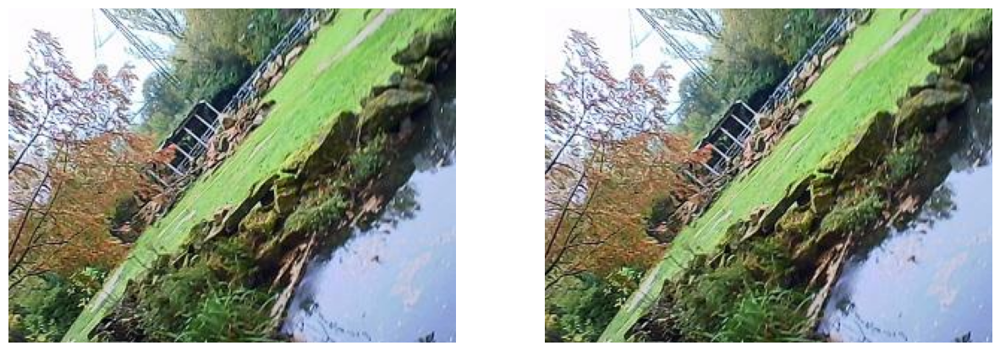

In [4]:
def plotImageGrid(image_Array:list, image_Titles_input=None, cmaps_input=None, n_rows = 2, figsize=(15,10)):

    # create empty names or cut name len
    image_Titles = [""]*len(image_Array) # set default titles
    
    cmaps = ["viridis"]*len(image_Array) # set default color maps
    if cmaps_input == "gray": #overwrite all with gray
        cmaps = ["gray"]*len(image_Array)

    # try to overwrite default names
    for i in range(len(image_Array)):
        try:
            if image_Titles_input:
                image_Titles[i] = image_Titles_input[i]
        except:
            pass
        try:
            if cmaps_input and cmaps_input != "gray":
                cmaps[i] = cmaps_input[i]
        except:
            pass

    n_columns = math.ceil(len(image_Array)/n_rows) #round up the number of columns needed
    # print(n_columns)
    plt.figure(figsize=figsize)
    for i ,(img, title, cmap) in enumerate(zip(image_Array, image_Titles, cmaps)):
        plt.subplot(n_rows,n_columns,i+1)
        plt.title(title) 
        if cmap!= '':
            plt.imshow(img, cmap=cmap)
        else:
             plt.imshow(img)
        plt.axis('off')
        
    plt.show()

im_color = io.imread("images/2111832_rgbimage.jpg") 
plotImageGrid([im_color,im_color], n_rows=1)

#### **1. Image smoothing in the spatial and frequency domain**
You are provided with a color image in (XXXXXX rgbimage.jpg) in “Files/assignment/files/XXXXX.zip” where XXXXX is your SSID. These images were taken by your course coordinator’s child at 4 years old.


#### 1.1 (5 points) Convert the color image which you have been provided to grayscale. Display the image with a gray colormap and an appropriate title. Points breakdown: 3 points for converting the color image to gray, 2 points for displaying your image

Text(0.5, 1.0, 'Gray scale image \n(2111832_rgbimage.jpg)')

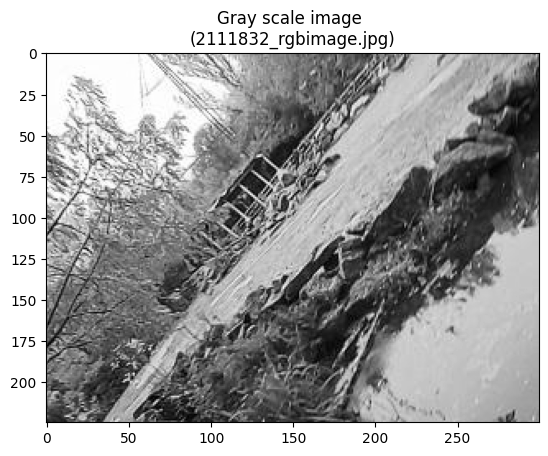

In [5]:
# read the image
im_color = io.imread("images/2111832_rgbimage.jpg") 

# convert to gray
im_gray = color.rgb2gray(im_color)
# show the image
plt.imshow(im_gray,cmap='gray')
plt.title('Gray scale image \n(2111832_rgbimage.jpg)')

#### 1.2 (5 points) Add 10% salt and pepper noise to the grayscale image

Text(0.5, 1.0, 'Gray scale image with 10% salt and pepper noise \n(2111832_rgbimage.jpg)')

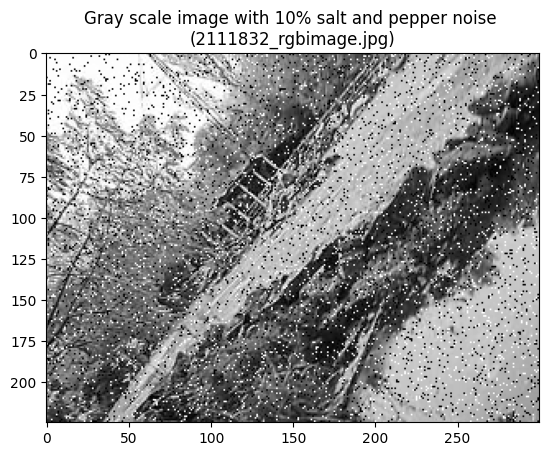

In [6]:
seed = 42
# add 10% salt and pepper noise
im_gray_sp = random_noise(im_gray, seed=seed, mode='s&p', amount=0.10)
# show the image
plt.imshow(im_gray_sp,cmap='gray')
plt.title('Gray scale image with 10% salt and pepper noise \n(2111832_rgbimage.jpg)')

#### 1.3 (5 points) Denoise the noisy image by performing a Gaussian blur with ‘sigma=1‘ in the spatial domain. Display your denoised image. Points breakdown: 3 points for denosing the image, 2 points for displaying your image.


Text(0.5, 1.0, 'Gray scale image with 10% salt and pepper noise and \ngaussian blur (sigma=1) (2111832_rgbimage.jpg)')

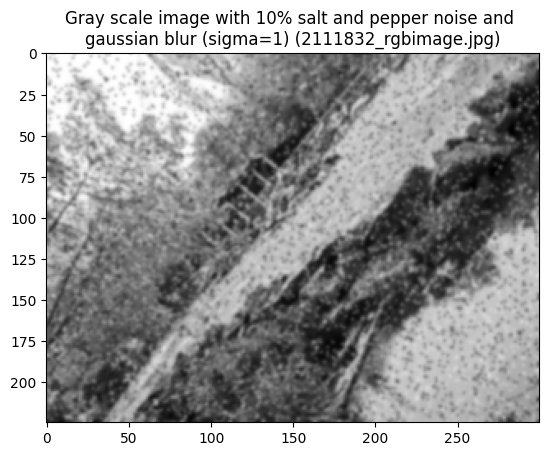

In [7]:
# Apply gaussian blur with sigma = 1
im_gauss = scipy.ndimage.gaussian_filter(im_gray_sp, sigma=1)

plt.imshow(im_gauss,cmap='gray')
plt.title('Gray scale image with 10% salt and pepper noise and \ngaussian blur (sigma=1) (2111832_rgbimage.jpg)')

#### 1.4 (5 points) Convert both the “clean” grayscale image (output of Q1.1) and noisy image (output of Q1.2) to the frequency domain and display the two FFT spectrums (FFT magnitude). Points breakdown: 2 points for converting to the frequency domain, 3 point for displaying the FFT spectrums.


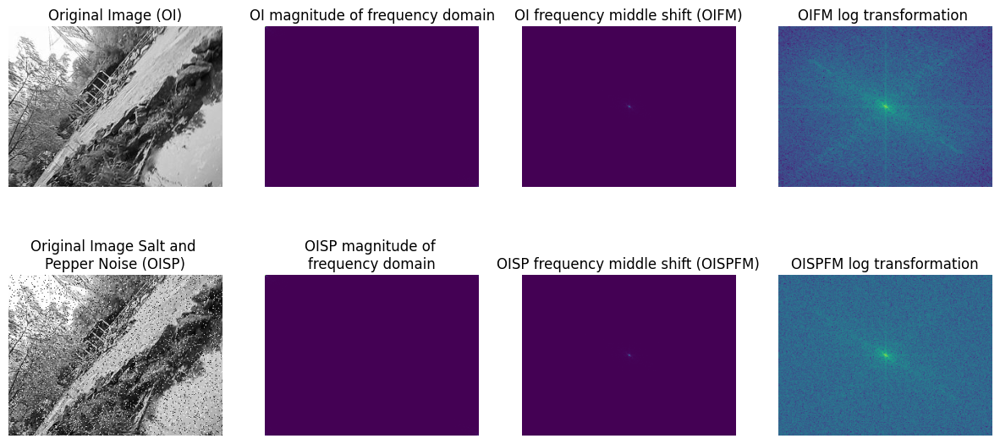

In [8]:
im_F = fftn(im_gray)
im_sp_F = fftn(im_gray_sp)

# Show magnitude of Frequency domain
im_S = abs(im_F)
im_sp_S = abs(im_sp_F) 

# shift frequency to the middle of the picture
im_Fc = fftshift(im_S)
im_sp_Fc = fftshift(im_sp_S)

# apply a log transformation
im_S2 = np.log(1 + abs(im_Fc))
im_sp_S2 = np.log(1 + abs(im_sp_Fc))

plotImageGrid(
    [im_gray, im_S, im_Fc, im_S2, im_gray_sp, im_sp_S, im_sp_Fc, im_sp_S2], # 
    ["Original Image (OI)","OI magnitude of frequency domain","OI frequency middle shift (OIFM)","OIFM log transformation ","Original Image Salt and \nPepper Noise (OISP)","OISP magnitude of \nfrequency domain","OISP frequency middle shift (OISPFM)","OISPFM log transformation"],
    cmaps_input= ["gray", "viridis","viridis","viridis","gray","viridis","viridis","viridis"],
    n_rows=2,
    figsize=(15,7))

#### 1.5 (5 points) Denoise the noisy image by performing a Gaussian blur with ‘sigma=1‘ in the frequency domain. Convert your denoised solution back to the spatial domain. Display your denoised image.Points breakdown: 2 points for denoising. 2 points for converting your solution to the spatial domain, 1 point for displaying the image.


In [9]:
def gaussianBlurr(im_input, sigma):
    im_freq = fftn(im_input)

    gauss_kernel = np.outer(signal.gaussian(im_freq.shape[0], sigma), signal.gaussian(im_freq.shape[1], sigma))
    freq_kernel = fftn(ifftshift(gauss_kernel))

    assert(im_freq.shape == gauss_kernel.shape)

    # Gaussian blur operation 
    im_freqconvolved = im_freq*freq_kernel
    im_convolved = ifftn(im_freqconvolved).real

    return im_convolved

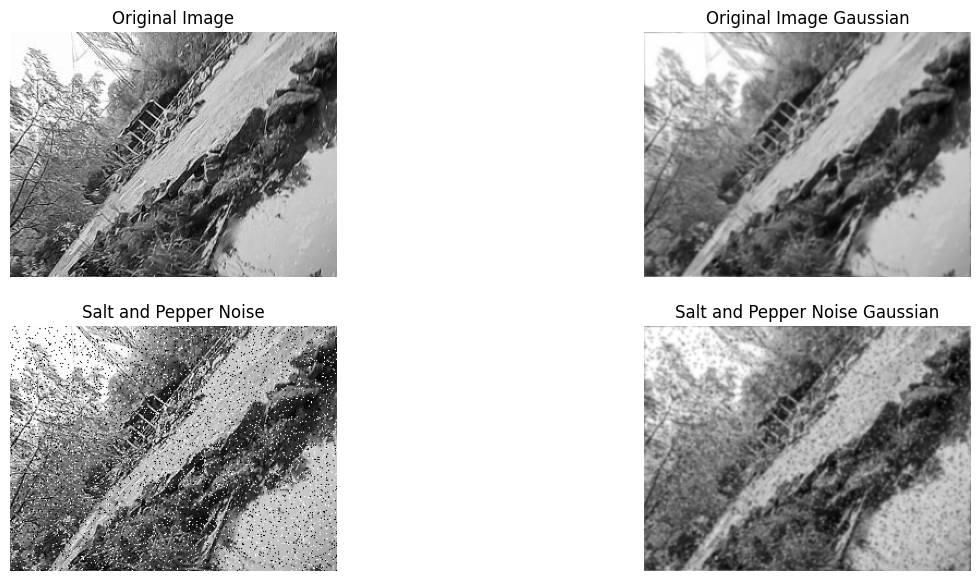

In [10]:
# 2D Gaussian kernel of size image with variance of 2

# im_F = fftn(im_gray)
# height, width = im_F.shape[0], im_F.shape[1]
# gauss_kernel = np.outer(signal.gaussian(height, 1), signal.gaussian(width,1))
# im_gray_Gaussian_1 = signal.fftconvolve(im_gray, gauss_kernel, mode = 'full')

# im_sp_F = fftn(im_gray_sp)
# height, width = im_sp_F.shape[0], im_sp_F.shape[1]
# gauss_kernel = np.outer(signal.gaussian(height, 1), signal.gaussian(width,1))
# im_gray_sp_Gaussian_1 = signal.fftconvolve(im_gray_sp, gauss_kernel, mode = 'full')


im_gray_Gaussian_1 = gaussianBlurr(im_gray, sigma = 1)
im_gray_sp_Gaussian_1 = gaussianBlurr(im_gray_sp, sigma = 1)


plotImageGrid(
    [im_gray,im_gray_Gaussian_1 , im_gray_sp, im_gray_sp_Gaussian_1], # 
    ["Original Image","Original Image Gaussian","Salt and Pepper Noise", "Salt and Pepper Noise Gaussian"],
    cmaps_input= "gray",
    n_rows=2,
    figsize=(15,7))

#### 1.6 (10 points) Compare the time taken to run Gaussian blur operations in the spatial domain vs the frequency domain the following 6 values of ‘sigma‘ - 1, 2, 16, 32, 64 and 128. Plot the time taken vs sigma for both spatial and frequency domain in the same plot. Briefly comment on your plot. When ‘sigma‘ is larger, the kernel is larger. Which domain is preferred for larger kernels? Points breakdown: 3 points for running the operations in the spatial domain. 3 points for running the operations in the frequency domain. 1 point for the plot. 2 points for your comment on the plot and answering the question.

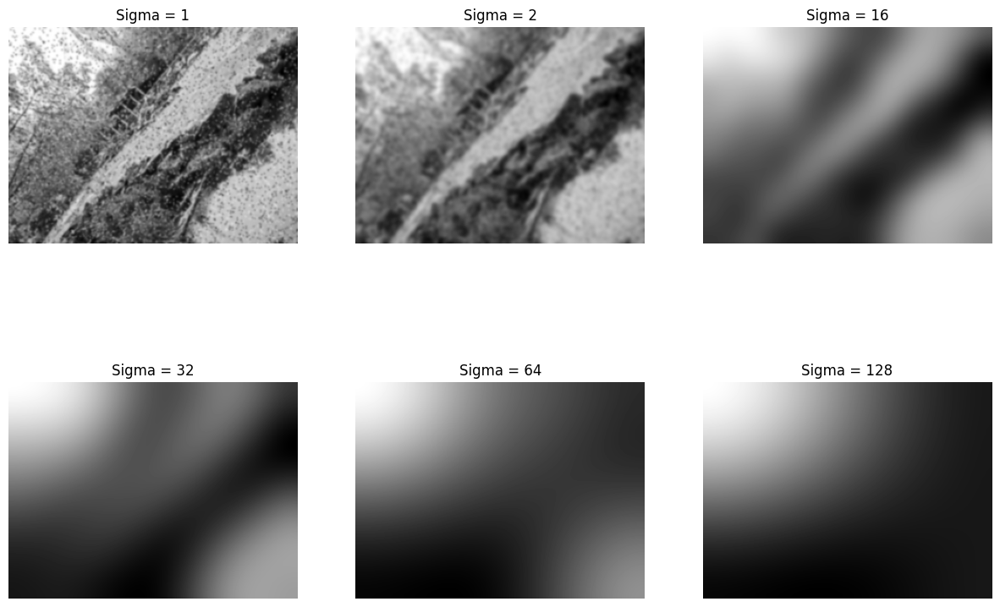

In [11]:
# Spacial domain (gaussian filter)
spacial_time_taken = []
spacial_images = []

sigma_range = [1,2,16,32,64,128]
for sigma in sigma_range:
    start = timer()

    im_gauss = scipy.ndimage.gaussian_filter(im_gray_sp, sigma=sigma)
    spacial_images.append(im_gauss)

    end = timer()

    spacial_time_taken.append(end - start)


plotImageGrid(spacial_images, ["Sigma = "+str(x) for x in sigma_range], cmaps_input="gray")

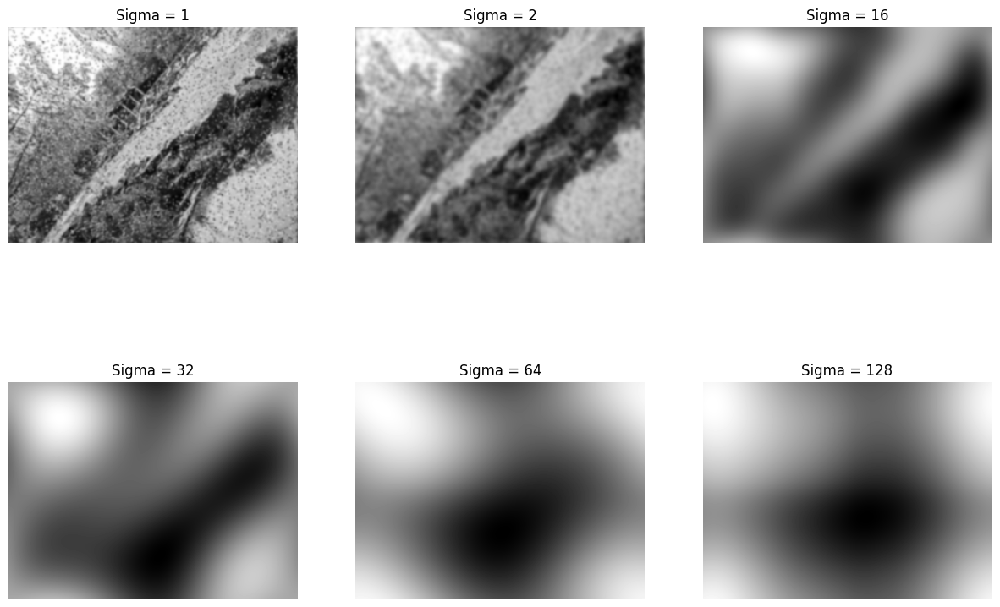

In [12]:
# Spacial domain (gaussian filter)
frequency_time_taken = []
frequency_images = []

for sigma in sigma_range:
    start = timer()
    
    im_gaussian = gaussianBlurr(im_gray_sp, sigma)

    # im_gauss = scipy.ndimage.gaussian_filter(im_gray_sp, sigma=sigma)
    frequency_images.append(im_gaussian)

    end = timer()
    frequency_time_taken.append(end - start)


plotImageGrid(frequency_images, ["Sigma = "+str(x) for x in sigma_range], cmaps_input="gray")

In [13]:
px.bar(x=range(1,7),y= [frequency_time_taken], barmode="group")

import plotly.graph_objects as go


fig = go.Figure(data=[
    go.Bar(name='Spacial domain <br>gaussian filters', x=["Sigma = "+str(x) for x in sigma_range], y=spacial_time_taken),
    go.Bar(name='Frequency domain <br>gaussian filters', x=["Sigma = "+str(x) for x in sigma_range], y=frequency_time_taken)
])
# Change the bar mode
fig.update_layout(barmode='group', title="Time taken to perform gaussian filtering")
fig.show()

In [14]:
# when sigma is larger, the time taken in the spacial domain 
# increases exponentially. The time taken for the frequency domain 
# stays roughly the same independent from the kernel size 
# (between 6 and 9 millisecond).
# For sigma = 1 and sigma = 2 the spacial domain filter is faster
# Therefore it is preferable to perform the gaussian filter with a 
# large kernel size in the frequency domain, if the kernel is big

#### **2. Extracting vessels from raw fundus images**
You are provided with a color image (XXXXXX vesselimage.jpg) and the corresponding binary segmentation
mask (XXXXXX vesselmask.jpg) in “Files/assignment/files/XXXXX.zip” where XXXXX is your SSID. The
binary image is the manual annotation results. These images are cropped from images in the High-Resolution
Fundus (HRF) Image Database [1].


#### 2.1. (5 points) Load the color image (XXXXXX vesselimage.jpg). Using subplots, display each color channel separately

In [15]:
im_vessels = io.imread('images/2111832_vesselimage.jpg')
im_vessels_mask = io.imread('images/2111832_vesselmask.jpg')

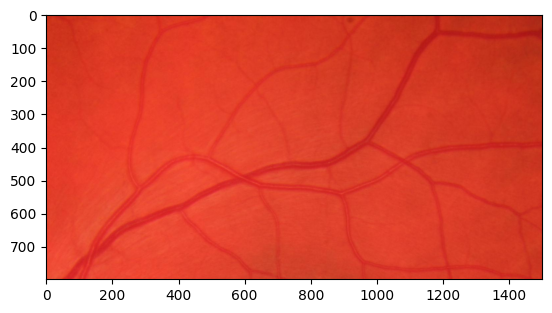

In [16]:
plt.imshow(im_vessels)

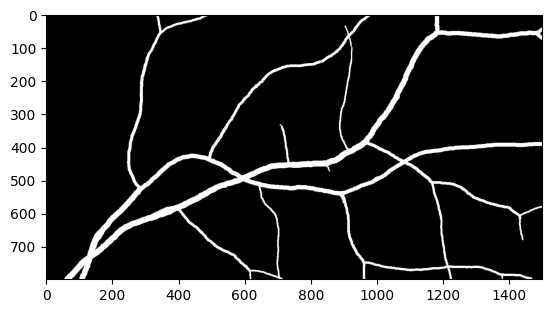

In [17]:
plt.imshow(im_vessels_mask, cmap='gray')

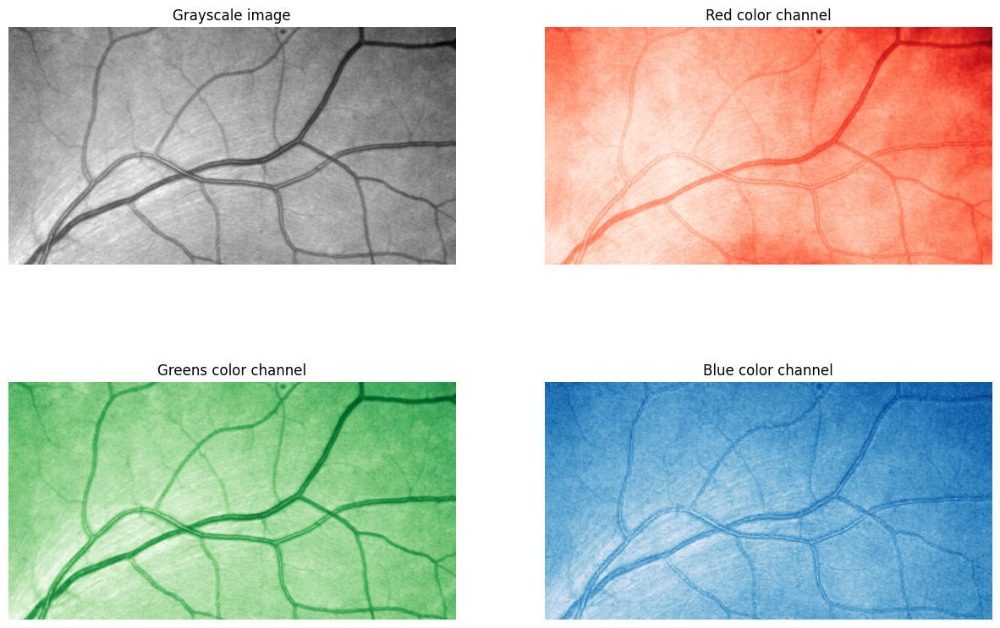

In [18]:
im_vessels_gray = color.rgb2gray(im_vessels)

im_vessels_r = im_vessels[:, :, 0]
im_vessels_g = im_vessels[:, :, 1]
im_vessels_b = im_vessels[:, :, 2]

image_titles =  ["Grayscale image", 'Red color channel', 'Greens color channel', 'Blue color channel']
cmaps = ["gray", "Reds_r", "Greens_r", "Blues_r"]

plotImageGrid([im_vessels_gray, im_vessels_r, im_vessels_g, im_vessels_b], image_Titles_input=image_titles, cmaps_input=cmaps, n_rows=2)

#### 2.2. (5 points) Convert the color image to HSV and display the hue, saturation and value channels.


In [19]:
im_vessels_hsv = color.rgb2hsv(im_vessels)

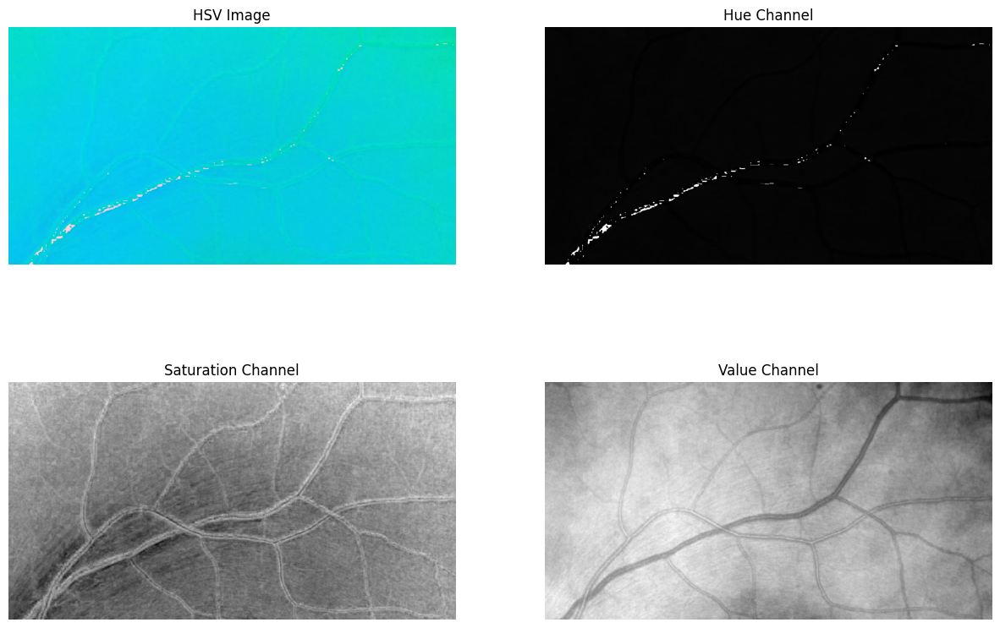

In [20]:
im_vessels_hue = im_vessels_hsv[:,:,0]
im_vessels_saturation = im_vessels_hsv[:,:,1]
im_vessels_value = im_vessels_hsv[:,:,2]

plotImageGrid([im_vessels_hsv, im_vessels_hue, im_vessels_saturation, im_vessels_value], 
              image_Titles_input=['HSV Image','Hue Channel', 'Saturation Channel', 'Value Channel'], 
              cmaps_input=["","gray","gray","gray"])



#### 2.3. (20 points) Segment the vessels to obtain a binary image where pixels representing the vessels are set to 1. You should compare two different image segmentation algorithms. You can apply morphological operations on these images. <br>
#### Points breakdown: Maximum of 10 points for each method. Comparing two thresholding algorithms only counts for 1 method. Report the steps you took to compute two image segmentation algorithms as comments in your code. Display the results of image processing at each step with appropriate titles.For each method: Full (10) points if each method successfully segments all the large vessels, most of the smaller vessels and none of the background. Show the results for each step you took. If the vessel shapes are slightly distorted or a 10% of the background is segmented or 50% of the smaller vessels are missing, you will get a maximum of 7 points each. If you make an attempt and the results are poor, you can get a maximum of 5 points each.


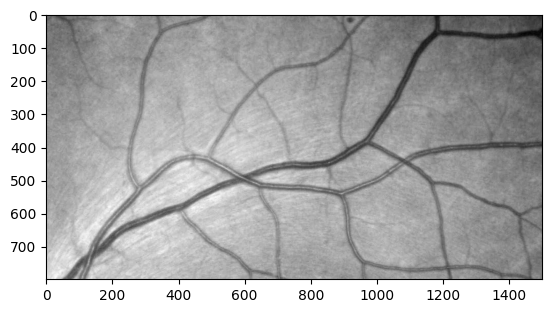

In [21]:
# start: 
plt.imshow(im_vessels_gray, cmap="gray")

C:\Users\tobi1\AppData\Local\Temp\ipykernel_536\423945759.py:15: UserWarning:

Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.



(array([   297.,    699.,   1344.,   2577.,   6030.,   9473.,  11986.,
         15332.,  18302.,  22840.,  29822.,  39517.,  55372.,  75331.,
         99666., 123981., 144068., 158583., 148951., 108302.,  65089.,
         33715.,  16365.,   8168.,   2690.]),
 array([  0. ,  10.2,  20.4,  30.6,  40.8,  51. ,  61.2,  71.4,  81.6,
         91.8, 102. , 112.2, 122.4, 132.6, 142.8, 153. , 163.2, 173.4,
        183.6, 193.8, 204. , 214.2, 224.4, 234.6, 244.8, 255. ]),
 <BarContainer object of 25 artists>)

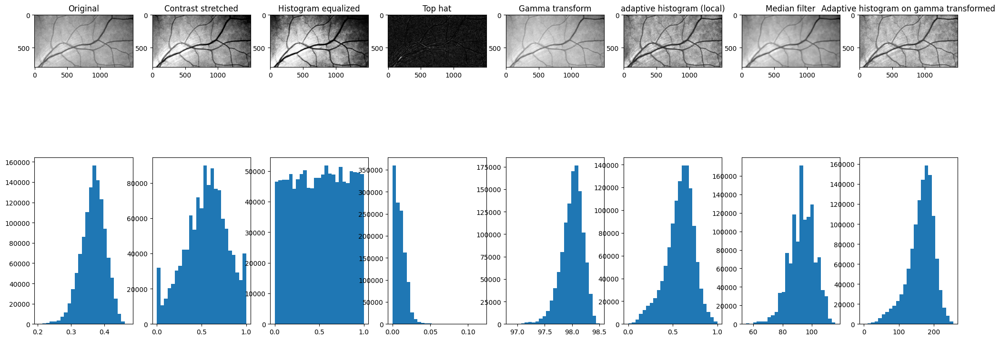

In [22]:
im = deepcopy(im_vessels_gray)     # read image from disk, provide the correct path 
# contrast stretching 
p2 = np.percentile(im, 2) 
p98 = np.percentile(im, 98) 
img_rescale = exposure.rescale_intensity(im, in_range=(p2, p98))

im_eq = exposure.equalize_hist(im)

tophat = morphology.white_tophat(im, disk(10))

im_gamma = exposure.adjust_gamma(im, 0.02, 100)

im_adapteq = exposure.equalize_adapthist(im)

denoised = rank.median(im, disk(11))

adaptive_denoised = exposure.equalize_adapthist(denoised)
adaptive_gamma = exposure.equalize_adapthist(im_gamma/255)*255

plt.figure(figsize=(25,10))

plt.subplot(2,8,1)
plt.title('Original')
plt.imshow(im, cmap='gray')

plt.subplot(2,8,2)
plt.title('Contrast stretched')
plt.imshow(img_rescale, cmap='gray')

plt.subplot(2,8,3)
plt.title('Histogram equalized')
plt.imshow(im_eq, cmap='gray')

plt.subplot(2,8,4)
plt.title('Top hat')
plt.imshow(tophat, cmap='gray')

plt.subplot(2,8,5)
plt.title('Gamma transform')
plt.imshow(im_gamma, cmap='gray')

plt.subplot(2,8,6)
plt.title('adaptive histogram (local)')
plt.imshow(im_adapteq, cmap='gray')

plt.subplot(2,8,7)
plt.title('Median filter')
plt.imshow(denoised, cmap='gray')

plt.subplot(2,8,8)
plt.title('Adaptive histogram on gamma transformed')
plt.imshow(adaptive_gamma, cmap='gray')


plt.subplot(2,8,9)
plt.hist( im.ravel(),bins=25)
plt.subplot(2,8,10)
plt.hist( img_rescale.ravel(),bins=25)
plt.subplot(2,8,11)
plt.hist( im_eq.ravel(),bins=25)
plt.subplot(2,8,12)
plt.hist( tophat.ravel(),bins=25)
plt.subplot(2,8,13)
plt.hist( im_gamma.ravel(),bins=25)
plt.subplot(2,8,14)
plt.hist( im_adapteq.ravel(),bins=25)
plt.subplot(2,8,15)
plt.hist( denoised.ravel(),bins=25)
plt.subplot(2,8,16)
plt.hist(adaptive_gamma.ravel(),bins=25)

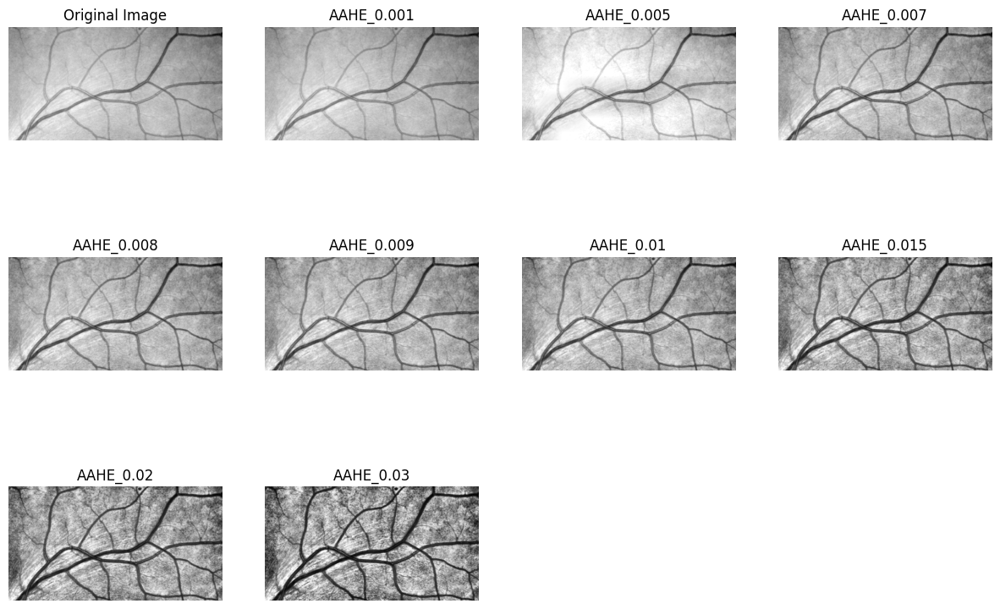

0.001
0.005
0.007
0.008
0.009
0.01
0.015
0.02
0.03


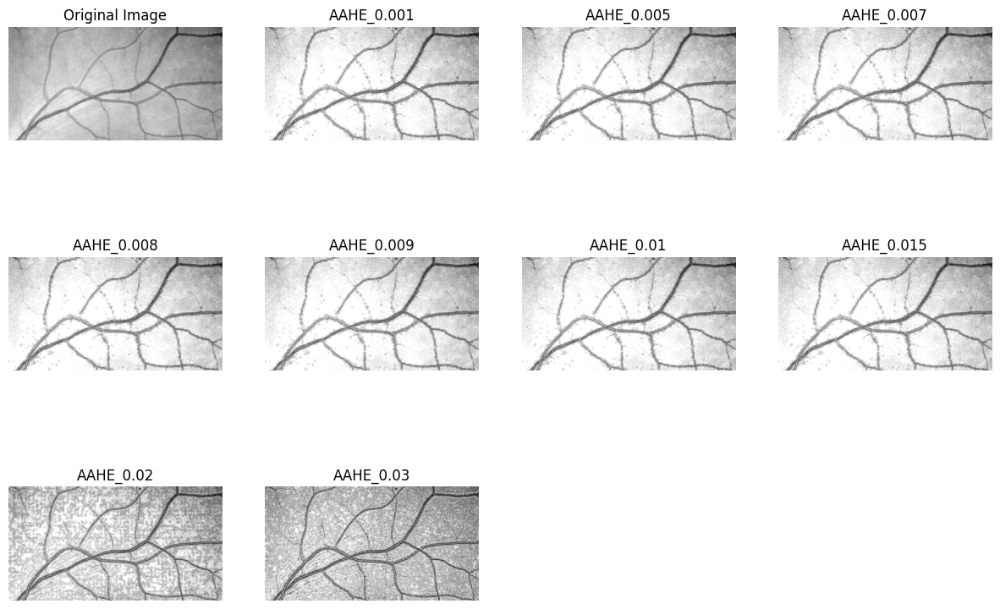

In [23]:
im = deepcopy(im_gamma/255)

images = []
clip_limits = [0.001, 0.005, 0.007, 0.008, 0.009, 0.01, 0.015, 0.02,0.03]
for n in clip_limits:
    images.append(exposure.equalize_adapthist(im, clip_limit=n))  # adaptive histogram equalization

# 'After Adaptive Histogram Equalization' = AAHE

plotImageGrid([im]+images, 
              image_Titles_input=['Original Image']+["AAHE_"+str(n) for n in clip_limits], 
              cmaps_input="gray",
              n_rows=3)

images = []
for n in clip_limits:
    print(n)
    kernel_size = disk(8)
    # big kernel size = 
    images.append(exposure.equalize_adapthist(im, kernel_size = 10, clip_limit=n))  # adaptive histogram equalization

# 'After Adaptive Histogram Equalization' = AAHE

plotImageGrid([im]+images, 
              image_Titles_input=['Original Image']+["AAHE_"+str(n) for n in clip_limits], 
              cmaps_input="gray",
              n_rows=3)

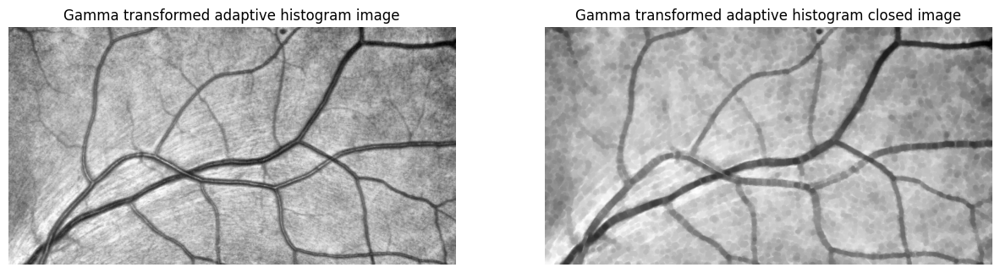

In [24]:
adaptive_gamma_closed = closing(adaptive_gamma, disk(6))

plotImageGrid([adaptive_gamma, adaptive_gamma_closed], 
              image_Titles_input=["Gamma transformed adaptive histogram image", "Gamma transformed adaptive histogram closed image"], 
              cmaps_input="gray", n_rows=1)

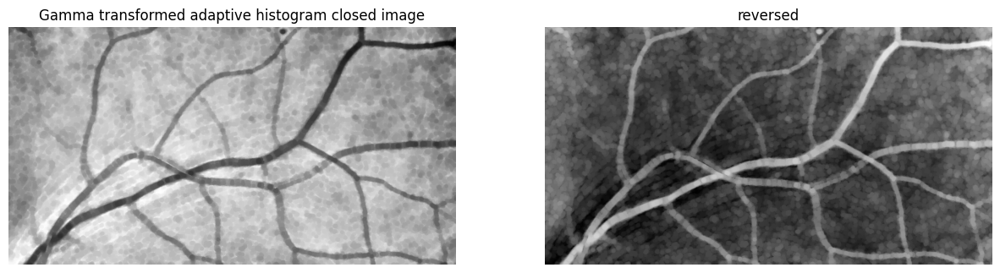

In [25]:
adaptive_gamma_closed_inv = util.invert(adaptive_gamma_closed)
adaptive_gamma_inv = util.invert(adaptive_gamma)

plotImageGrid([adaptive_gamma_closed, adaptive_gamma_closed_inv], 
              image_Titles_input=["Gamma transformed adaptive histogram closed image", "reversed"], 
              cmaps_input="gray", n_rows=1)

# Apply Thresholding

skimage.filters.thresholding.threshold_isodata
skimage.filters.thresholding.threshold_li
skimage.filters.thresholding.threshold_mean
skimage.filters.thresholding.threshold_minimum
skimage.filters.thresholding.threshold_otsu
skimage.filters.thresholding.threshold_triangle
skimage.filters.thresholding.threshold_yen


(<Figure size 800x500 with 8 Axes>,
 array([<AxesSubplot: title={'center': 'Original'}>,
        <AxesSubplot: title={'center': 'Isodata'}>,
        <AxesSubplot: title={'center': 'Li'}>,
        <AxesSubplot: title={'center': 'Mean'}>,
        <AxesSubplot: title={'center': 'Minimum'}>,
        <AxesSubplot: title={'center': 'Otsu'}>,
        <AxesSubplot: title={'center': 'Triangle'}>,
        <AxesSubplot: title={'center': 'Yen'}>], dtype=object))

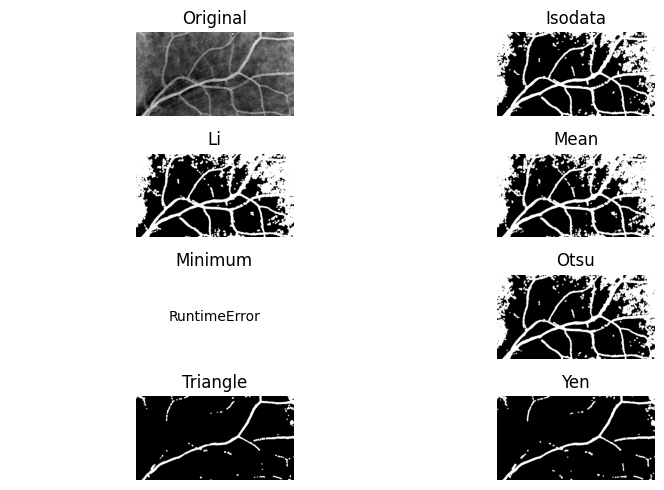

In [26]:
im = deepcopy(adaptive_gamma_closed_inv)
try_all_threshold(im)

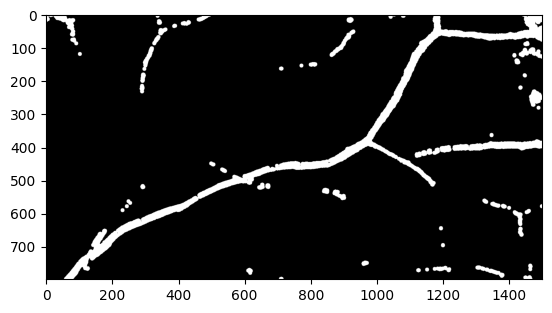

In [27]:
window_size = 701
thresh_sauvola = filters.threshold_triangle(im)
im_sauvola = im > thresh_sauvola

plt.imshow(im_sauvola, cmap='gray')

# 

# Segmentation algorithm 1: Flood filling

In [28]:
def image_show(image, nrows=1, ncols=1, cmap='gray', **kwargs):
    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 16))
    ax.imshow(image, cmap='gray')
    ax.axis('off')
    return fig, ax

(-0.5, 1499.5, 798.5, -0.5)

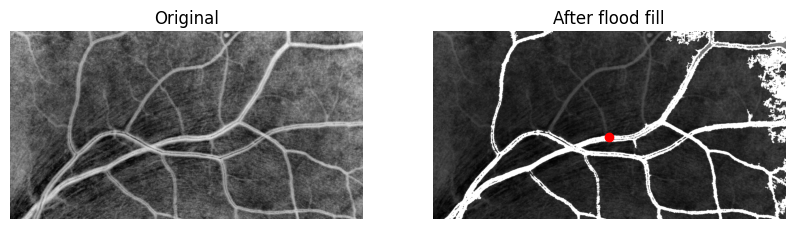

In [29]:
im = deepcopy(adaptive_gamma_inv)

seed = [450, 750]

filled_adaptive_gamma_inv = flood_fill(im, (seed[0], seed[1]), 255, tolerance=45)

fig, ax = plt.subplots(ncols=2, figsize=(10, 5))
ax[0].imshow(im, cmap=plt.cm.gray)
ax[0].set_title('Original')
ax[0].axis('off')

ax[1].imshow(filled_adaptive_gamma_inv, cmap=plt.cm.gray)
ax[1].plot(seed[1], seed[0], 'ro')  # seed point
ax[1].set_title('After flood fill')
ax[1].axis('off')

# try_all_threshold(filled)


skimage.filters.thresholding.threshold_isodata
skimage.filters.thresholding.threshold_li
skimage.filters.thresholding.threshold_mean
skimage.filters.thresholding.threshold_minimum
skimage.filters.thresholding.threshold_otsu
skimage.filters.thresholding.threshold_triangle
skimage.filters.thresholding.threshold_yen


(<Figure size 800x500 with 8 Axes>,
 array([<AxesSubplot: title={'center': 'Original'}>,
        <AxesSubplot: title={'center': 'Isodata'}>,
        <AxesSubplot: title={'center': 'Li'}>,
        <AxesSubplot: title={'center': 'Mean'}>,
        <AxesSubplot: title={'center': 'Minimum'}>,
        <AxesSubplot: title={'center': 'Otsu'}>,
        <AxesSubplot: title={'center': 'Triangle'}>,
        <AxesSubplot: title={'center': 'Yen'}>], dtype=object))

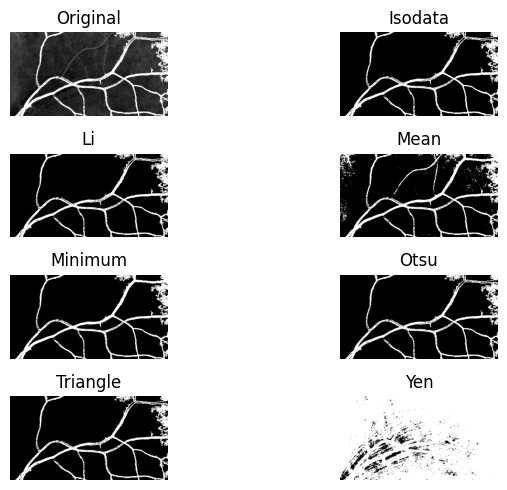

In [30]:
try_all_threshold(filled_adaptive_gamma_inv)

- The flood filling algorithms work very well in general to detect the bigger vessels in the middle.
- But it does not captures the smaller vessels. Some of the smaller vessels get smaller when they merge with a bigger vessels. 
- In addition the background on the right side is captured.

# Segmentation algorithm 2:

https://scikit-image.org/docs/stable/auto_examples/applications/plot_pixel_graphs.html#sphx-glr-auto-examples-applications-plot-pixel-graphs-py

https://scikit-image.org/docs/stable/auto_examples/edges/plot_ridge_filter.html#sphx-glr-auto-examples-edges-plot-ridge-filter-py

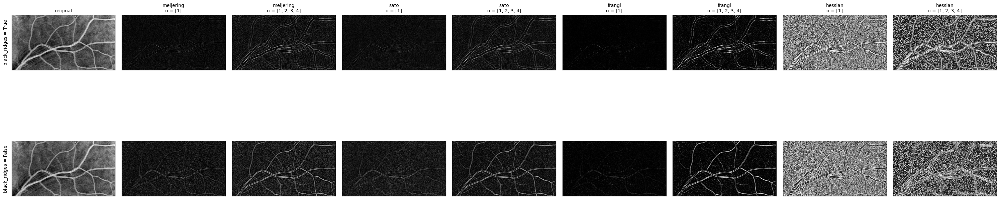

In [31]:
def original(image, **kwargs):
    """Return the original image, ignoring any kwargs."""
    return image


# image = color.rgb2gray(im_vessels)#[300:700, 700:900]
image = deepcopy(adaptive_gamma_inv)
cmap = plt.cm.gray

plt.rcParams["axes.titlesize"] = "medium"
axes = plt.figure(figsize=(30,10)).subplots(2, 9)
for i, black_ridges in enumerate([True, False]):
    for j, (func, sigmas) in enumerate([
            (original, None),
            (meijering, [1]),
            (meijering, range(1, 5)),
            (sato, [1]),
            (sato, range(1, 5)),
            (frangi, [1]),
            (frangi, range(1, 5)),
            (hessian, [1]),
            (hessian, range(1, 5)),
    ]):
        result = func(image, black_ridges=black_ridges, sigmas=sigmas)
        axes[i, j].imshow(result, cmap=cmap)
        if i == 0:
            title = func.__name__
            if sigmas:
                title += f"\n\N{GREEK SMALL LETTER SIGMA} = {list(sigmas)}"
            axes[i, j].set_title(title)
        if j == 0:
            axes[i, j].set_ylabel(f'{black_ridges = }')
        axes[i, j].set_xticks([])
        axes[i, j].set_yticks([])

plt.tight_layout()
plt.show()

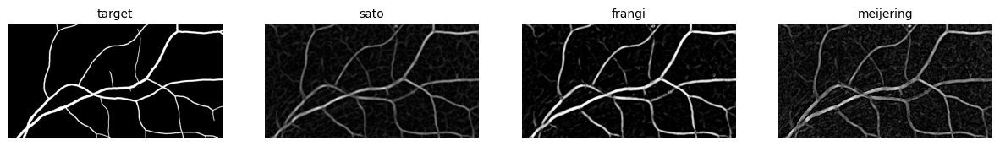

In [32]:
im = deepcopy(adaptive_gamma_closed_inv)


plotImageGrid([im_vessels_mask,
                sato(im, range(1, 10), black_ridges=False),
               frangi(im, range(1, 10), black_ridges=False),
               meijering(im, range(1, 10), black_ridges=False),
               ], 
              image_Titles_input=["target","sato", "frangi", "meijering"], 
              cmaps_input="gray", n_rows=1)

skimage.filters.thresholding.threshold_isodata
skimage.filters.thresholding.threshold_li
skimage.filters.thresholding.threshold_mean
skimage.filters.thresholding.threshold_minimum
skimage.filters.thresholding.threshold_otsu
skimage.filters.thresholding.threshold_triangle
skimage.filters.thresholding.threshold_yen


(<Figure size 800x500 with 8 Axes>,
 array([<AxesSubplot: title={'center': 'Original'}>,
        <AxesSubplot: title={'center': 'Isodata'}>,
        <AxesSubplot: title={'center': 'Li'}>,
        <AxesSubplot: title={'center': 'Mean'}>,
        <AxesSubplot: title={'center': 'Minimum'}>,
        <AxesSubplot: title={'center': 'Otsu'}>,
        <AxesSubplot: title={'center': 'Triangle'}>,
        <AxesSubplot: title={'center': 'Yen'}>], dtype=object))

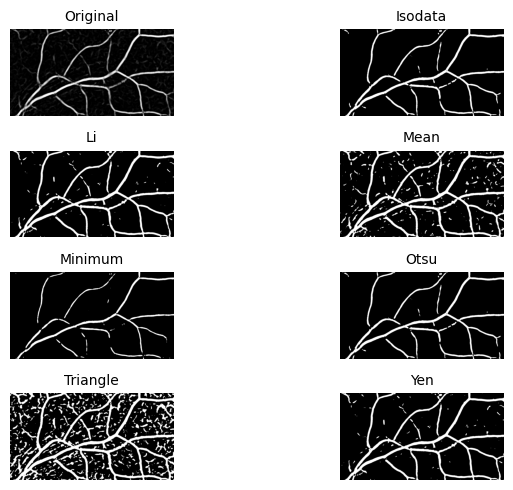

In [33]:
im = deepcopy(adaptive_gamma_closed_inv)

im_frangi = frangi(im, range(1, 10), black_ridges=False)
try_all_threshold(im_frangi)

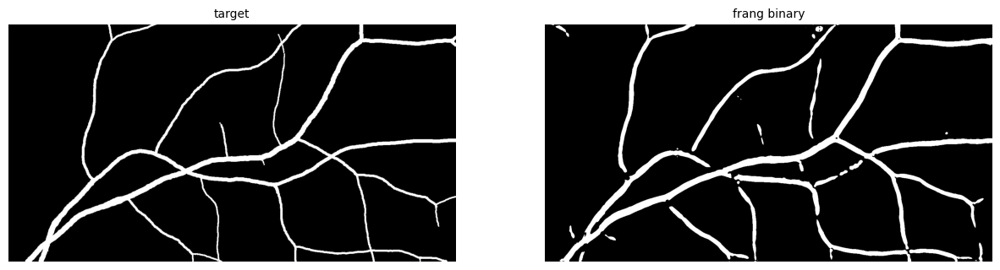

In [34]:
thresh_isodata = filters.threshold_isodata(im_frangi)
im_thresh_frangi = im_frangi > thresh_isodata

plotImageGrid([im_vessels_mask,
                im_thresh_frangi
               ], 
              image_Titles_input=["target","frang binary"], 
              cmaps_input="gray", n_rows=1)


- The Fragi with a σ of [1,2,3,4,5,6,7,8,9,10] works very well
- The small and the large vessels are captured
- The big vessels do not have holes in them
- It capture the vessles accurately in it's shape
- Some connections between vessels are not captured

#### 2.4. (5 points) Overlay your segmentation solutions with the binary mask (manual annotation results).

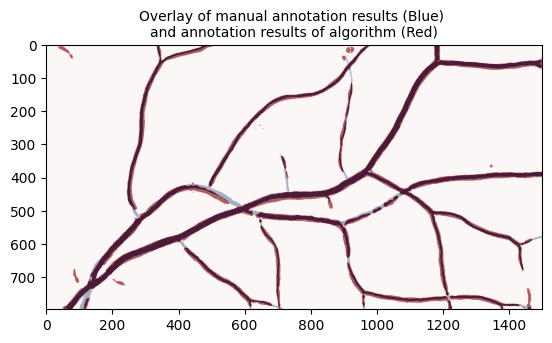

In [35]:
fig = plt.figure()

plt.imshow(im_vessels_mask, cmap='Blues', alpha=0.9)
plt.imshow(im_thresh_frangi, cmap='Reds', alpha=0.6)
plt.title('Overlay of manual annotation results (Blue) \nand annotation results of algorithm (Red)')
plt.show()

#### 2.5. (5 points) Compute the Dice or Jaccard score between your solution and the binary mask

https://scikit-learn.org/stable/modules/generated/sklearn.metrics.jaccard_score.html

In [36]:
print('Jaccard score: ',jaccard_score(im_vessels_mask.ravel(), im_thresh_frangi.ravel(), average="micro"))

Jaccard score:  0.7951264227331755


https://towardsdatascience.com/how-accurate-is-image-segmentation-dd448f896388

In [37]:
def dice_metric(target, inputs):
    intersection = 2.0 * (target * inputs).sum()
    union = target.sum() + inputs.sum()
    if target.sum() == 0 and inputs.sum() == 0:
        return 1.0

    return intersection / union

In [38]:
print('Dice score: ',dice_metric(im_vessels_mask.ravel(), im_thresh_frangi.ravel()))

Dice score:  1.7567309274113971


#### **3 Processing a binary image of segmented vessels**
You are provided with a binary image of vessels (XXXXXX vesselmask.jpg) where XXXXX is your SSID

####

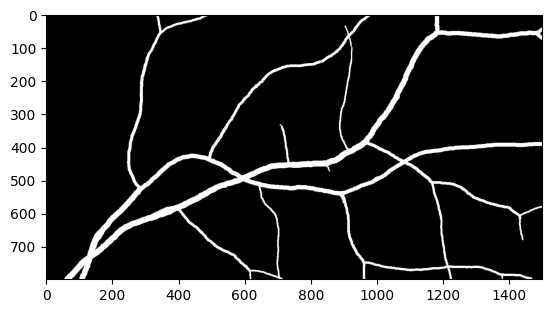

In [39]:
im_vessels_mask = io.imread('images/2111832_vesselmask.jpg')#.astype(float)

plt.imshow(im_vessels_mask, cmap="gray")

#### 3.1. (2 points) Remove smaller vessels (less than 8 pixels wide) with morphological opening

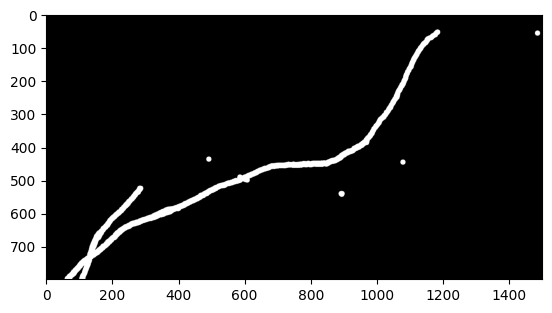

In [40]:
se = disk(8)
im2 = binary_opening(im_vessels_mask,se)

plt.imshow(im2, cmap="gray")

#### 3.2. (3 points) Apply morphological thinning to obtain a 1 pixel thin centerline of the vascular network

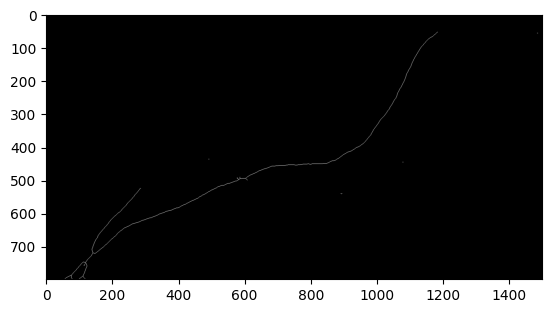

In [41]:
im3 = thin(im2)

plt.imshow(im3, cmap="gray")

#### 3.3. (5 points) Find overall length of the vascular network in the image after thinning

https://scikit-image.org/docs/stable/auto_examples/segmentation/plot_regionprops.html

In [42]:
label_img = label(im3)
regions = regionprops(label_img)

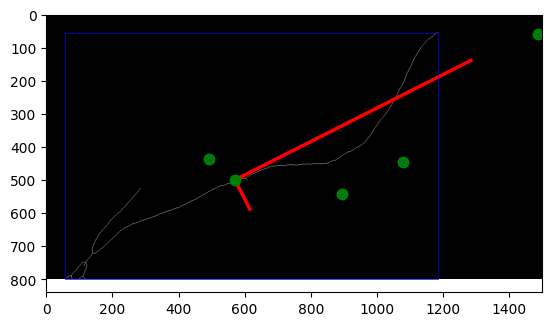

In [43]:
fig, ax = plt.subplots()
ax.imshow(im3, cmap=plt.cm.gray)

for props in regions:
    y0, x0 = props.centroid
    orientation = props.orientation
    x1 = x0 + math.cos(orientation) * 0.5 * props.axis_minor_length
    y1 = y0 - math.sin(orientation) * 0.5 * props.axis_minor_length
    x2 = x0 - math.sin(orientation) * 0.5 * props.axis_major_length
    y2 = y0 - math.cos(orientation) * 0.5 * props.axis_major_length

    ax.plot((x0, x1), (y0, y1), '-r', linewidth=2.5)
    ax.plot((x0, x2), (y0, y2), '-r', linewidth=2.5)
    ax.plot(x0, y0, '.g', markersize=15)

    minr, minc, maxr, maxc = props.bbox
    bx = (minc, maxc, maxc, minc, minc)
    by = (minr, minr, maxr, maxr, minr)
    ax.plot(bx, by, '-b', linewidth=0.5)

# ax.axis((0, 600, 600, 0))
plt.show()


In [44]:
total_length = sum([props.axis_major_length+props.axis_minor_length for props in regions])
total_length

1812.6423250196822

#### 3.4. (5 points) Find the length of the vascular network which is wider than 40 pixels. In other words, fin dHint: You can apply a medial axis transforms to compute the width of the vessel for the pixels of the skeleton

vascular network
Minor length: 196.7902437346017 
Major length: 1598.7972680644555


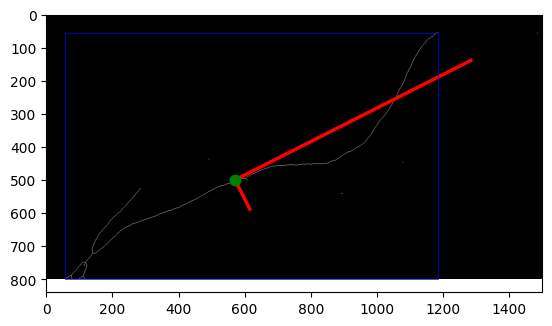

In [45]:
fig, ax = plt.subplots()
ax.imshow(im3, cmap=plt.cm.gray)

for props in regions:
    if props.axis_minor_length > 40:

        y0, x0 = props.centroid
        orientation = props.orientation
        x1 = x0 + math.cos(orientation) * 0.5 * props.axis_minor_length
        y1 = y0 - math.sin(orientation) * 0.5 * props.axis_minor_length
        x2 = x0 - math.sin(orientation) * 0.5 * props.axis_major_length
        y2 = y0 - math.cos(orientation) * 0.5 * props.axis_major_length
        print('vascular network\nMinor length:',props.axis_minor_length,"\nMajor length:",props.axis_major_length)

        ax.plot((x0, x1), (y0, y1), '-r', linewidth=2.5)
        ax.plot((x0, x2), (y0, y2), '-r', linewidth=2.5)
        ax.plot(x0, y0, '.g', markersize=15)

        minr, minc, maxr, maxc = props.bbox
        bx = (minc, maxc, maxc, minc, minc)
        by = (minr, minr, maxr, maxr, minr)
        ax.plot(bx, by, '-b', linewidth=0.5)

# ax.axis((0, 600, 600, 0))
plt.show()


#### 3.5. (5 points) Computer orientation of the vascular network in the image after thinning. Display the orientation distribution of the vascular network in a polar (rose) plot

####

571.0096525096525 499.1994851994852
1284.0905546727397 137.8771871567693


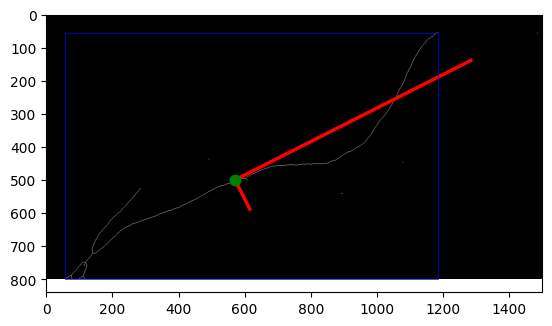

In [46]:
fig, ax = plt.subplots()
ax.imshow(im3, cmap=plt.cm.gray)

for props in regions:
    if props.axis_minor_length > 40:

        y0, x0 = props.centroid
        orientation = props.orientation
        # print('vascular network)
        # print('Pure orientation:',orientation)
        # print('Main orientation:',math.sin(orientation))

        print(x0, y0)
        
        x1 = x0 + math.cos(orientation) * 0.5 * props.axis_minor_length
        y1 = y0 - math.sin(orientation) * 0.5 * props.axis_minor_length
        x2 = x0 - math.sin(orientation) * 0.5 * props.axis_major_length
        y2 = y0 - math.cos(orientation) * 0.5 * props.axis_major_length

       
        print(x2, y2)
       

        ax.plot((x0, x1), (y0, y1), '-r', linewidth=2.5)
        ax.plot((x0, x2), (y0, y2), '-r', linewidth=2.5)
        ax.plot(x0, y0, '.g', markersize=15)

        minr, minc, maxr, maxc = props.bbox
        bx = (minc, maxc, maxc, minc, minc)
        by = (minr, minr, maxr, maxr, minr)
        ax.plot(bx, by, '-b', linewidth=0.5)

# ax.axis((0, 600, 600, 0))
plt.show()


In [47]:
x0, y0 = 571.0096525096525, 499.1994851994852
x2, y2 = 1284.0905546727397, 137.8771871567693


In [48]:
y2 - y0

-361.3222980427159

In [49]:
x2 - x0

713.0809021630872

In [50]:
slope = (y2 - y0)/(x2 - x0)
slope = slope*-1 #because 0 of y axis is on top

https://www.adamsmith.haus/python/answers/how-to-calculate-the-angle-between-a-line-and-the-x-axis-in-python

In [51]:
angle_in_radians = math.atan(slope)
angle_in_radians

0.4689979238109617

In [52]:
print('The degree of the main vascular network is:',math.degrees(angle_in_radians))

The degree of the main vascular network is: 26.871601634766243


In [53]:
radius_props  = [] #direction of major axis
theta_props = [] #length of major axis

for props in regions:
    y0, x0 = props.centroid
    orientation = props.orientation

    x2 = x0 - math.sin(orientation) * 0.5 * props.axis_major_length
    y2 = y0 - math.cos(orientation) * 0.5 * props.axis_major_length

    slope = (y2 - y0)/(x2 - x0)
    slope = slope*-1 #because 0 of y axis is on top

    angle_in_radians = math.atan(slope)

    radius = math.degrees(angle_in_radians)

    print(radius)
    print(props.axis_major_length)
    radius_props.append(radius)
    theta_props.append(props.axis_major_length)

26.871601634766243
1598.7972680644555
0.0
3.265986323710904
0.0
3.265986323710904
0.0
3.265986323710904
0.0
5.656854249492381


https://plotly.com/python/polar-chart/

In [54]:
fig = px.scatter_polar(r=theta_props, theta=radius_props, title="Polar scatter distribution of vascular major axis length and angle")
fig.show()

In [55]:
radius_props  = [] #direction of major axis
theta_props = [] #length of major axis

for props in regions:
    y0, x0 = props.centroid
    orientation = props.orientation

    x1 = x0 + math.cos(orientation) * 0.5 * props.axis_minor_length
    y1 = y0 - math.sin(orientation) * 0.5 * props.axis_minor_length

    slope = (y1 - y0)/(x1 - x0)

    slope = slope*-1 #because 0 of y axis is on top

    angle_in_radians = math.atan(slope)

    radius = math.degrees(angle_in_radians)

    print(radius)
    print(props.axis_major_length)
    if radius < 0:
        radius = 360 + radius

    radius_props.append(radius)
    theta_props.append(props.axis_major_length)

-63.128398365233764
1598.7972680644555
nan
3.265986323710904
nan
3.265986323710904
nan
3.265986323710904
90.0
5.656854249492381


C:\Users\tobi1\AppData\Local\Temp\ipykernel_536\210220972.py:11: RuntimeWarning:

invalid value encountered in double_scalars

C:\Users\tobi1\AppData\Local\Temp\ipykernel_536\210220972.py:11: RuntimeWarning:

divide by zero encountered in double_scalars



In [56]:
fig = px.scatter_polar(r=theta_props, theta=radius_props, title="Polar scatter distribution of vascular minor axis length and angle")
fig.show()


#### 3.6. (5 points) Compute the length and orientation of each branch (e.g. with the sknw package (https://github.com/ImagePy/sknw)).

https://github.com/Image-Py/sknw

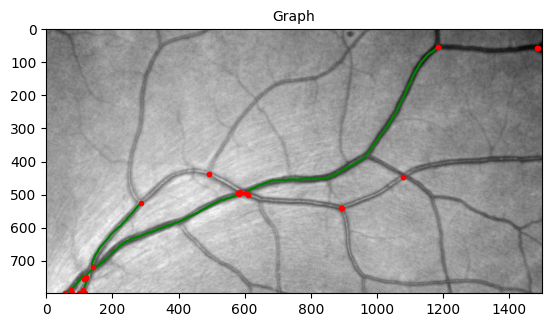

In [57]:
from skimage.morphology import skeletonize
from skimage import data
import sknw

# open and skeletonize
# img = im_vessels_mask
# ske = skeletonize(~img).astype(np.uint16)

# build graph from skeleton
graph = sknw.build_sknw(im3)

# draw image
plt.imshow(im_vessels_gray, cmap='gray')

# draw edges by pts
for (s,e) in graph.edges():
    ps = graph[s][e]['pts']
    plt.plot(ps[:,1], ps[:,0], 'green')
    
# draw node by o
nodes = graph.nodes()
ps = np.array([nodes[i]['o'] for i in nodes])
plt.plot(ps[:,1], ps[:,0], 'r.')

# title and show
plt.title('Graph')
plt.show()


####

####

####

####

####

####

####

####

####